In [1]:
from shapely.geometry import Point
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import folium
from folium.plugins import MarkerCluster
from folium.plugins import FastMarkerCluster

%matplotlib inline

In [2]:
zipcodes = gpd.read_file('../data/Zip Codes.geojson')
print(zipcodes.crs)
zipcodes.head( )

epsg:4326


,zip,objectid,po_name,shape_stlength,shape_starea,geometry
0,37115,1,MADISON,178783.02488886821,596553400.57885742,"MULTIPOLYGON (((-86.68725 36.31821, -86.68722 ..."
1,37203,33,NASHVILLE,93532.890729543782,120334624.37817383,"MULTIPOLYGON (((-86.78734 36.16688, -86.78711 ..."
2,37216,3,NASHVILLE,75820.997821400058,188884682.28344727,"MULTIPOLYGON (((-86.73451 36.23774, -86.73425 ..."
3,37204,9,NASHVILLE,93180.292250425613,200664795.51708984,"MULTIPOLYGON (((-86.77914 36.13424, -86.77923 ..."
4,37027,11,BRENTWOOD,159760.6942933173,174978422.04101562,"MULTIPOLYGON (((-86.81258 36.06319, -86.81263 ..."


In [3]:
zipcodes.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 57 entries, 0 to 56
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   zip             57 non-null     object  
 1   objectid        57 non-null     object  
 2   po_name         57 non-null     object  
 3   shape_stlength  57 non-null     object  
 4   shape_starea    57 non-null     object  
 5   geometry        57 non-null     geometry
dtypes: geometry(1), object(5)
memory usage: 2.8+ KB


In [4]:
psv = pd.read_csv('../data/Property_Standards_Violations.csv', dtype={'ZIP': 'str'})
psv.head()

,Request #,Date Received,Property APN,Property Address,City,State,ZIP,Property Owner,Complaint Source,Reported Problem,Status,Council District,Last Activity Date,Last Activity,Last Activity Result,Violations Noted,Mapped Location
0,19-1211706,09/13/2019,07214004000,1124 CAHAL AVE,NASHVILLE,TN,37206,"HOUCK, MATTHEW",INSPECTOR REPORTED,HG,DONE,7.0,10/11/2019,Violation Inspection - PS,Violation Resolved,HIGH WEEDS,"1124 CAHAL AVE\nNASHVILLE, TN 37206\n(36.19642..."
1,20-1249933,12/16/2020,09316004600,115 LAFAYETTE ST,NASHVILLE,TN,37210,"MOON, HANNAH",INSPECTOR REPORTED,sign,DONE,17.0,12/16/2020,PS - Sign Removal,DONE,NaN,"115 LAFAYETTE ST\nNASHVILLE, TN 37210\n(36.148..."
2,19-1213838,10/24/2019,07508018500,4837 CONCORD DR,HERMITAGE,TN,37076,"PERRY, DANIEL K. & TAMARA L.",INSPECTOR REPORTED,AMV/ROW,DONE,12.0,11/26/2019,Administrative Hearing Vehicle - PS,Violation Resolved,NaN,"4837 CONCORD DR\nHERMITAGE, TN 37076\n(36.2078..."
3,20-1225184,04/21/2020,13300014500,0 ELYSIAN FIELDS RD,NASHVILLE,TN,37211,NASHVILLE ZOO INC,Audit,NO VIOLATION FOUND,DONE,26.0,04/21/2020,Initial Audit Inspection - PS,PS - No Violation Found - Audit,NaN,"0 ELYSIAN FIELDS RD\nNASHVILLE, TN 37211"
4,20-1218434,01/16/2020,082140A06000CO,828 1ST AVE N,NASHVILLE,TN,37201,"BOWEN, ANDREW C.",EMAIL,no strp permit,DONE,19.0,01/17/2020,Violation Inspection - PS,Violation Resolved,STRP PERMIT REQUIRED,"828 1ST AVE N\nNASHVILLE, TN 37201\n(36.173394..."


In [5]:
psv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80088 entries, 0 to 80087
Data columns (total 17 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Request #             80088 non-null  object 
 1   Date Received         80088 non-null  object 
 2   Property APN          79810 non-null  object 
 3   Property Address      79810 non-null  object 
 4   City                  79808 non-null  object 
 5   State                 79810 non-null  object 
 6   ZIP                   79808 non-null  object 
 7   Property Owner        80088 non-null  object 
 8   Complaint Source      80087 non-null  object 
 9   Reported Problem      79403 non-null  object 
 10  Status                80088 non-null  object 
 11  Council District      79777 non-null  float64
 12  Last Activity Date    79786 non-null  object 
 13  Last Activity         79786 non-null  object 
 14  Last Activity Result  79780 non-null  object 
 15  Violations Noted   

# Need to make columns lowercase with no_spaces

In [6]:
psv.columns = psv.columns.str.lower()
psv.columns = psv.columns.str.replace(' ', '_')
psv.columns

Index(['request_#', 'date_received', 'property_apn', 'property_address',
       'city', 'state', 'zip', 'property_owner', 'complaint_source',
       'reported_problem', 'status', 'council_district', 'last_activity_date',
       'last_activity', 'last_activity_result', 'violations_noted',
       'mapped_location'],
      dtype='object')

# Extracting lat and long from mapped_location using a gnarly bit of code from Mahesh

In [7]:
lat_long = psv['mapped_location'].str.split('\n').str[2].str[1:-1].str.split(', ', expand=True)
lat_long.head(2)

,0,1
0,36.196426,-86.739839
1,36.148449,-86.761276


# Next we will rename it and add it to the end of our psv dataframe

In [8]:
lat_long.columns = ['lat','long']
lat_long.head(2)

,lat,long
0,36.196426,-86.739839
1,36.148449,-86.761276


In [9]:
psvll = pd.concat([psv,lat_long],axis=1)

In [10]:
psvll.head(2)

,request_#,date_received,property_apn,property_address,city,state,zip,property_owner,complaint_source,reported_problem,status,council_district,last_activity_date,last_activity,last_activity_result,violations_noted,mapped_location,lat,long
0,19-1211706,09/13/2019,07214004000,1124 CAHAL AVE,NASHVILLE,TN,37206,"HOUCK, MATTHEW",INSPECTOR REPORTED,HG,DONE,7.0,10/11/2019,Violation Inspection - PS,Violation Resolved,HIGH WEEDS,"1124 CAHAL AVE\nNASHVILLE, TN 37206\n(36.19642...",36.196426,-86.739839
1,20-1249933,12/16/2020,09316004600,115 LAFAYETTE ST,NASHVILLE,TN,37210,"MOON, HANNAH",INSPECTOR REPORTED,sign,DONE,17.0,12/16/2020,PS - Sign Removal,DONE,NaN,"115 LAFAYETTE ST\nNASHVILLE, TN 37210\n(36.148...",36.148449,-86.761276


# Our violations df has only the columns we need. 
# Since NaN values are not useful to us for this exercise, we will remove any row with a NaN value

In [11]:
violations = psvll[['zip','violations_noted', 'lat', 'long']]
violations.head(2)

,zip,violations_noted,lat,long
0,37206,HIGH WEEDS,36.196426,-86.739839
1,37210,NaN,36.148449,-86.761276


In [12]:
violations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80088 entries, 0 to 80087
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   zip               79808 non-null  object
 1   violations_noted  43629 non-null  object
 2   lat               78361 non-null  object
 3   long              78361 non-null  object
dtypes: object(4)
memory usage: 2.4+ MB


In [13]:
violations = violations.dropna(axis=0,how='any')
violations.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 42915 entries, 0 to 80087
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   zip               42915 non-null  object
 1   violations_noted  42915 non-null  object
 2   lat               42915 non-null  object
 3   long              42915 non-null  object
dtypes: object(4)
memory usage: 1.6+ MB


# Adding geometry column

In [14]:
violations['geometry'] = violations.apply(lambda x: Point((float(x.long), 
                                                         float(x.lat))), 
                                        axis=1)
violations.head(3)

,zip,violations_noted,lat,long,geometry
0,37206,HIGH WEEDS,36.196426,-86.739839,POINT (-86.739839 36.196426)
4,37201,STRP PERMIT REQUIRED,36.173394,-86.780918,POINT (-86.780918 36.173394)
12,37210,"OPEN STORAGE, JUNK, TRASH, DEBRIS",36.149475,-86.769682,POINT (-86.769682 36.149475)


# Make a GeoDataFrame

In [15]:
geo_vio = gpd.GeoDataFrame(violations, 
                           crs = zipcodes.crs, 
                           geometry = violations['geometry'])

In [16]:
type(geo_vio)

geopandas.geodataframe.GeoDataFrame

# Woo hoo! We did it!

# Next it's time for a join....IN SPAAAACE!!!!! (spatial join. it's a spatial join)

In [17]:
zipcodes = zipcodes[['zip', 'po_name', 'geometry']]

In [18]:
violations_by_zip = gpd.sjoin(geo_vio, zipcodes, op = 'within')

In [19]:
violations_by_zip.head()

,zip_left,violations_noted,lat,long,geometry,index_right,zip_right,po_name
0,37206,HIGH WEEDS,36.196426,-86.739839,POINT (-86.73984 36.19643),15,37206,NASHVILLE
34,37206,"EXT OF BLDGS � WIND, SKYLIT DOOR FRAMES",36.18906,-86.756303,POINT (-86.75630 36.18906),15,37206,NASHVILLE
38,37206,ADDRESS ID RESIDENTIAL,36.177104,-86.747368,POINT (-86.74737 36.17710),15,37206,NASHVILLE
49,37206,UNLIC / INOP / ACCUMULATION MTR VEHICLES,36.171503,-86.7436,POINT (-86.74360 36.17150),15,37206,NASHVILLE
65,37206,"HIGH WEEDS,PARKING ON GRASS,UNLIC / INOP / ACC...",36.196059,-86.736021,POINT (-86.73602 36.19606),15,37206,NASHVILLE


# We'll clean these columns up a bit...

In [22]:
violations_by_zip = violations_by_zip[['zip_left', 'violations_noted', 'lat', 'long', 'geometry']]
violations_by_zip = violations_by_zip.rename(columns = {'zip_left':'zip'})
violations_by_zip.head(2)

,zip,violations_noted,lat,long,geometry
0,37206,HIGH WEEDS,36.196426,-86.739839,POINT (-86.73984 36.19643)
34,37206,"EXT OF BLDGS � WIND, SKYLIT DOOR FRAMES",36.18906,-86.756303,POINT (-86.75630 36.18906)


In [23]:
violations_by_zip['zip'].value_counts()

37211    4796
37013    4630
37115    4311
37207    4059
37208    3311
37206    2829
37217    2748
37076    2549
37209    2094
37210    1897
37216    1720
37214    1658
37218    1223
37138    1214
37203     968
37212     567
37204     416
37221     405
37205     322
37215     257
37072     202
37189     193
37080     172
37027      81
37220      78
37201      75
37219      32
37213      29
37015      25
37143      13
37228       9
37122       8
37135       5
00000       2
37064       2
Name: zip, dtype: int64

# Let's look at Bellevue, 37221. 
I don't want the codes people at my door!

In [24]:
violations_37221 = violations_by_zip.loc[violations_by_zip['zip'] == '37221']
violations_37221.shape

(405, 5)

In [25]:
polygon37221 = zipcodes.loc[zipcodes['zip'] == '37221']
polygon37221.shape

(1, 3)

# Basic map time

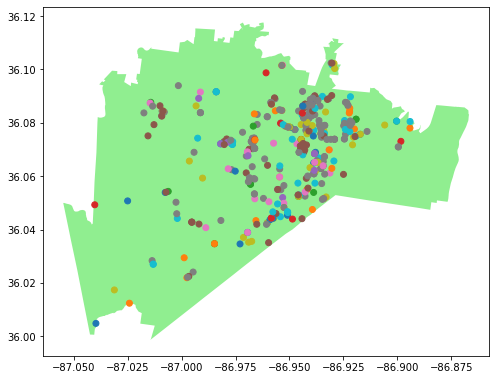

In [26]:
ax = polygon37221.plot(figsize = (8, 10), color = 'lightgreen')
violations_37221.plot(ax = ax, column = 'violations_noted');
plt.show();

In [28]:
center = polygon37221.geometry.centroid
center

<ipython-input-28-d19dcfc6aa45>:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center = polygon37221.geometry.centroid


9    POINT (-86.97531 36.06283)
dtype: geometry

# FOLIUM TIME

In [29]:
area_center = [center.y, center.x]
print(area_center)

[9    36.062832
dtype: float64, 9   -86.975314
dtype: float64]


In [35]:
map_37221 = folium.Map(location =  area_center, zoom_start = 12)
map_37221

In [44]:
map_37221 = folium.Map(location =  area_center, zoom_start = 14)
folium.GeoJson(polygon37221).add_to(map_37221)

#iterate through stops_in_37207 to create locations and markers 
#for each bus stop
#remember for Folium locations, lat is listed first!!

for row_index, row_values in violations_37221.iterrows():
    loc = [row_values['lat'], row_values['long']]
    pop = str(row_values['violations_noted'])
    icon=folium.Icon(color="red",icon="fas fa-exclamation-triangle", prefix='fa')
    
    marker = folium.Marker(
        location = loc, 
        popup = pop, icon = icon) 
# can add another point outside of for loop 
    marker.add_to(map_37221)
map_37221.save('../maps/map37221.html')

#display our map
map_37221



In [42]:
violations_37221.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 405 entries, 78 to 79089
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   zip               405 non-null    object  
 1   violations_noted  405 non-null    object  
 2   lat               405 non-null    object  
 3   long              405 non-null    object  
 4   geometry          405 non-null    geometry
dtypes: geometry(1), object(4)
memory usage: 19.0+ KB


# It works!! Party time

# Now let's kick it up a notch
# 37211 (nolensville) has over 4,000 violations 
# Can we cluster map that?

In [45]:
nolensville = violations_by_zip.loc[violations_by_zip['zip'] == '37211']
nolensville.shape

(4796, 5)

In [46]:
polygon_nolensville = zipcodes.loc[zipcodes['zip'] == '37211']
polygon_nolensville.shape

(1, 3)

In [47]:
nolen_center = polygon_nolensville.geometry.centroid
nolen_center

<ipython-input-47-c0baf4400067>:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  nolen_center = polygon_nolensville.geometry.centroid


50    POINT (-86.72308 36.06711)
dtype: geometry

In [48]:
nolen = [nolen_center.y, nolen_center.x]
print(nolen)

[50    36.067111
dtype: float64, 50   -86.723079
dtype: float64]


In [49]:
map_nolen = folium.Map(location =  nolen, zoom_start = 12)
map_nolen

In [50]:
cluster_map_nolen = folium.Map(location =  nolen, zoom_start = 12)

#create a marker cluster
marker_cluster = MarkerCluster().add_to(cluster_map_nolen)

folium.GeoJson(polygon_nolensville).add_to(cluster_map_nolen)

# inside the loop add each marker to the cluster
for row_index, row_values in nolensville.iterrows():
    loc = [row_values['lat'], row_values['long']]
    pop = str(row_values['violations_noted'])
    icon=folium.Icon(color="red",icon="fas fa-exclamation-triangle", prefix='fa')
    
    marker = folium.Marker(
        location = loc, 
        popup = pop,
    icon = icon) 
    
    marker.add_to(marker_cluster)

    
#save an interactive HTML map by calling .save()
cluster_map_nolen.save('../maps/cluster_map_nolen.html')

cluster_map_nolen

# Rock and Roll!!